In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
from AnalysisUtils import AnalysisUtils
AnalysisUtilsObj=AnalysisUtils()

dataset=pd.read_csv('PreProcessedTradeSettlementDetails.csv')
dataset

,Trade ID,Trade Type,Instrument Type,Trade Value,Trade Volume,Counterparty ID,Counterparty Risk Score,Counterparty Failures,Settlement Status,Settlement Failure Reason,...,Time to Settle,Counterparty Failure Rate,Currency,Settlement Type,Client ID,ISIN,Trade Matched or Not,Expected Settlement Date,Actual Settlement Date,Days Difference
0,T00001,Buy,Equity,1.712199e+05,3256,CP108,0.018296,2,Success,NONE,...,35.993201,0.02,USD,AoP,CL260,INE000062D,Matched,2024-06-06,2024-06-06,0
1,T00002,Sell,Bond,1.043790e+06,9626,CP192,0.248703,2,Success,NONE,...,65.124897,0.02,USD,AoP,CL221,INE000042U,Matched,2024-08-06,2024-08-06,0
2,T00003,Buy,Derivative,2.320635e+06,9868,CP474,0.640106,1,Success,NONE,...,53.515460,0.01,JPY,AoP,CL15,INE000031V,Matched,2024-11-07,2024-11-07,0
3,T00004,Buy,Derivative,4.900256e+05,187,CP205,0.542102,4,Success,NONE,...,39.627149,0.04,EUR,FoP,CL36,INE000052D,Matched,2024-10-27,2024-10-27,0
4,T00005,Buy,Derivative,1.460759e+06,8275,CP61,0.056382,1,Success,NONE,...,50.762670,0.01,GBP,AoP,CL34,INE000060S,Matched,2024-11-28,2024-11-28,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,T09996,Buy,Derivative,3.865635e+05,120,CP261,0.378298,7,Success,NONE,...,48.779840,0.07,INR,AoP,CL179,INE000092C,Matched,2024-12-04,2024-12-04,0
9996,T09997,Sell,Bond,7.483296e+04,7317,CP74,0.121223,8,Success,NONE,...,44.925273,0.08,GBP,FoP,CL257,INE000095D,Matched,2024-01-07,2024-01-07,0
9997,T09998,Sell,Equity,1.215368e+06,510,CP425,0.895436,0,Fail,Client Instruction Missing,...,29.695967,0.00,JPY,FoP,CL226,INE000080Q,Matched,2024-12-23,2024-12-27,4
9998,T09999,Sell,Equity,8.735853e+05,8422,CP126,0.366819,1,Success,NONE,...,54.585931,0.01,JPY,FoP,CL123,INE000080Q,Matched,2024-03-17,2024-03-17,0


In [2]:
dataset.shape

(10000, 25)

In [3]:
dataset.shape[0]

10000

In [4]:
dataset.shape[1]

25

#Pairplot is used to see all the combinations of the relations of the input values

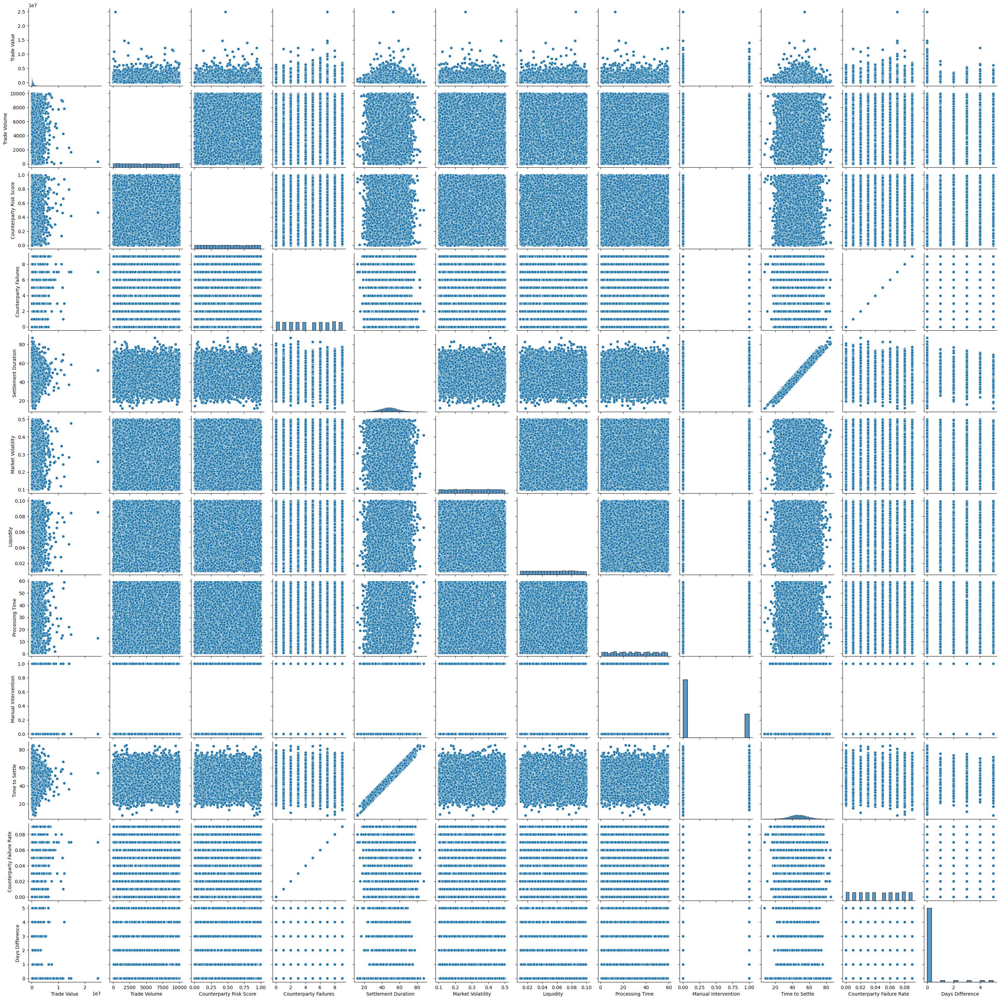

In [5]:
import seaborn as sns
sns.pairplot(dataset)

#Trade volume are very normal between 0 to 100000

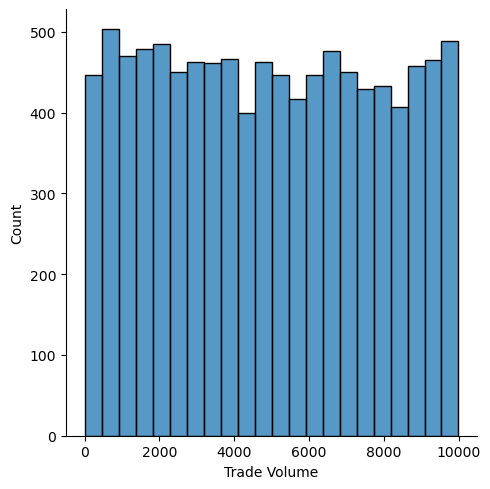

In [6]:
sns.displot(dataset['Trade Volume'])

#Most of the trade value are 1000000, when trade value increasing, number of trades are reducing. 

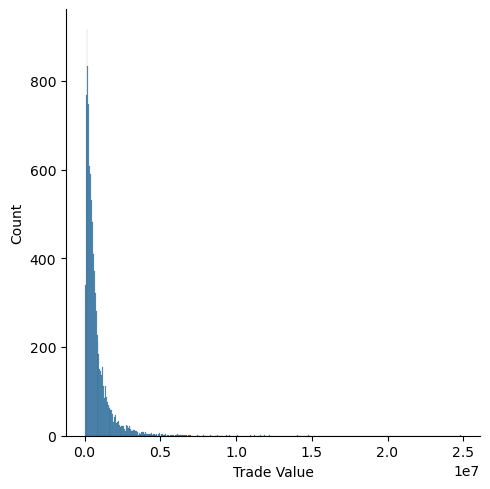

In [7]:
sns.displot(dataset['Trade Value'])

#Manual intervention is very less overall

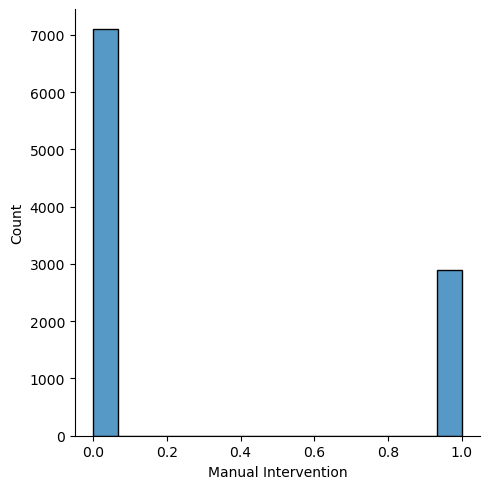

In [8]:
sns.displot(dataset['Manual Intervention'])

#All the counterparty risk score are occured between 400 to 500 times

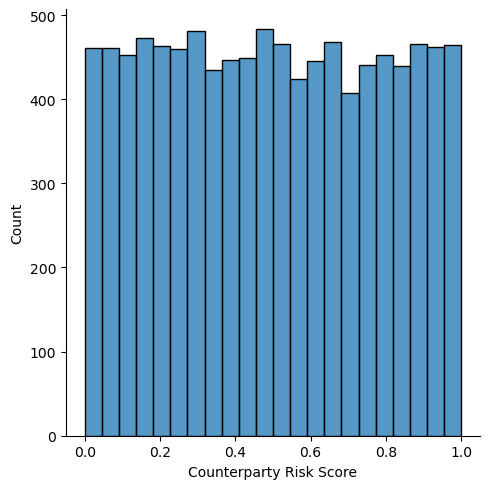

In [9]:
sns.displot(dataset['Counterparty Risk Score'])

#All the counter party failures are failed in more than 850 times

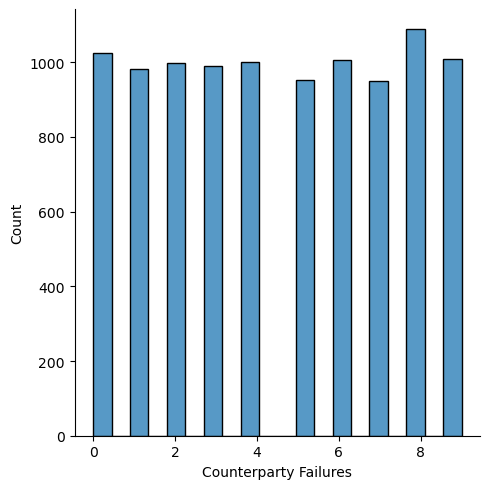

In [10]:
sns.displot(dataset['Counterparty Failures'])

#Most of the trade settled between 40 to 60 duration

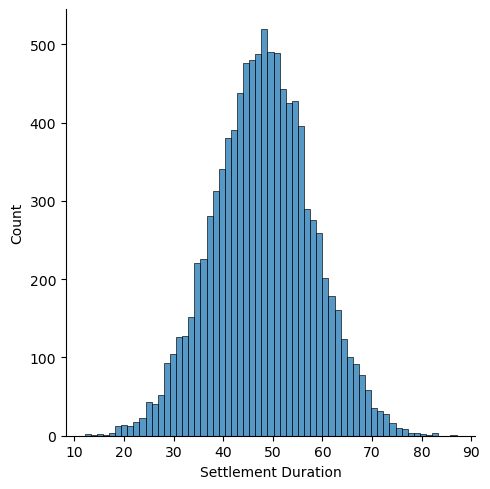

In [11]:
sns.displot(dataset['Settlement Duration'])

#Market volitility count are between 400 to 500. So it looks like we have Market volatility all the time.

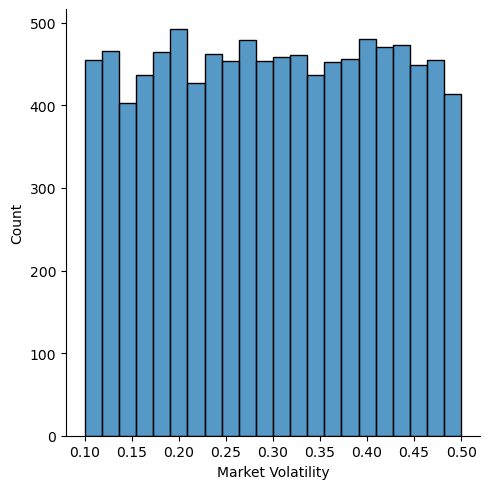

In [12]:
sns.displot(dataset['Market Volatility'])

#Liquidity count are average 450. It looks like normal to have the all kind of liquidity

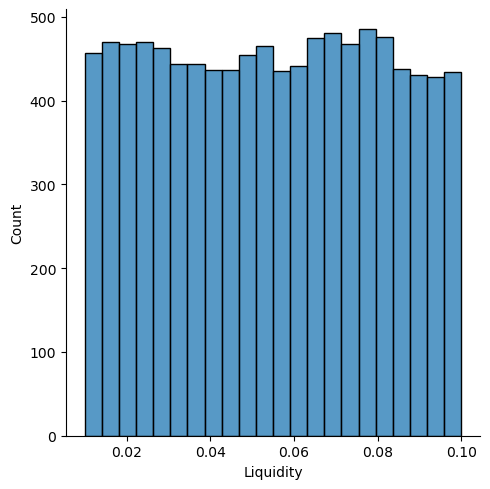

In [13]:
sns.displot(dataset['Liquidity'])

#time taken to settle the trade are varying

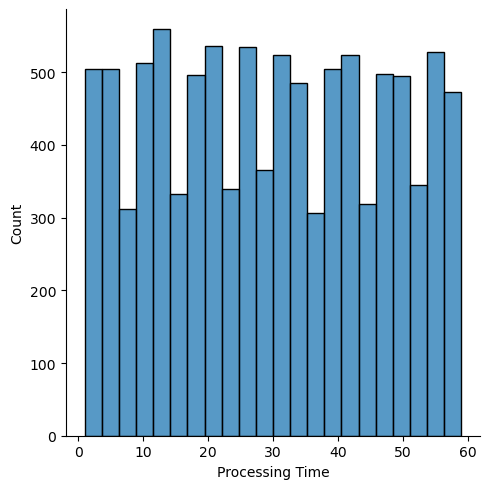

In [14]:
sns.displot(dataset['Processing Time'])

#We have less manual intervention count

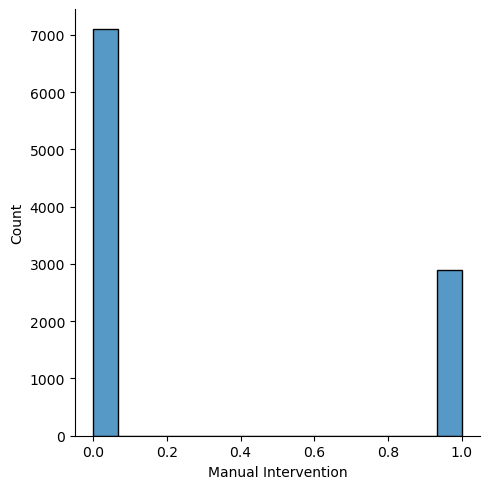

In [15]:
sns.displot(dataset['Manual Intervention'])

#Less and high  time to settle are less in numbers. Most of the trades settled with the medium time between 30 to 40

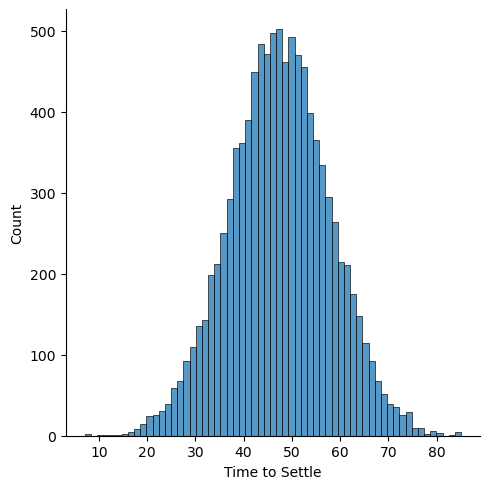

In [16]:
sns.displot(dataset['Time to Settle'])

#Almost all cunter failure has count between 900 to 1000 

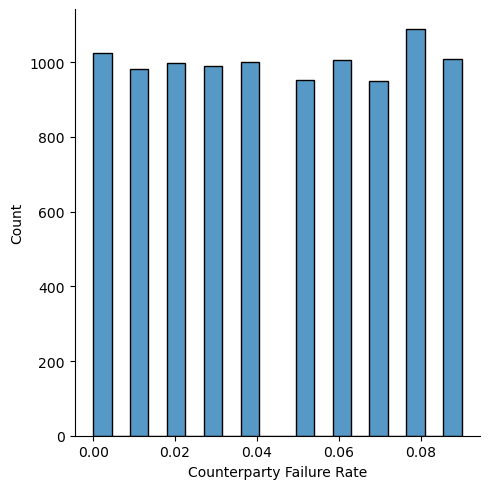

In [17]:
sns.displot(dataset['Counterparty Failure Rate'])

#Most of the trades are has trade value less than 10000000

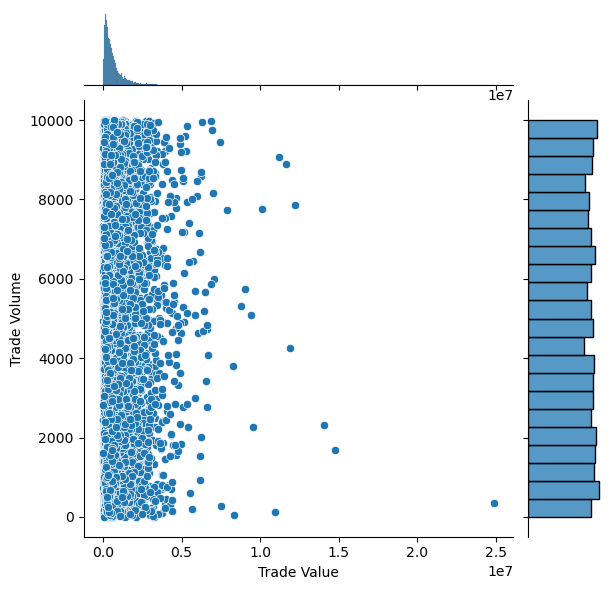

In [18]:
sns.jointplot(x='Trade Value',y='Trade Volume',data=dataset)

#Most of the trades are has trade value less than 10000000

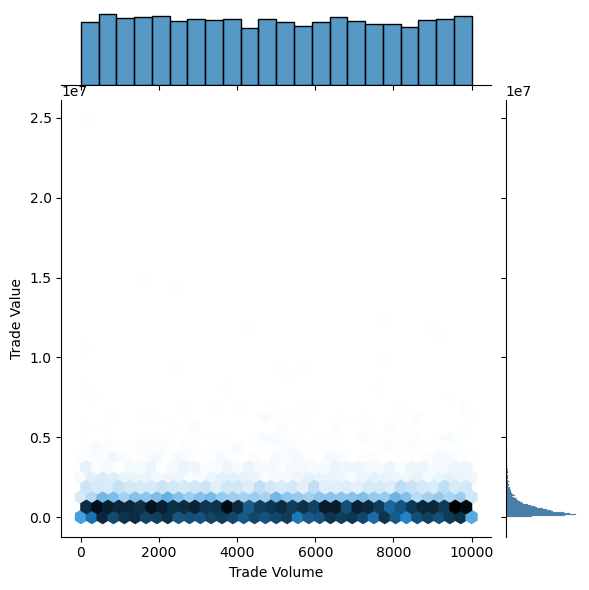

In [19]:
sns.jointplot(x='Trade Volume',y='Trade Value',data=dataset, kind='hex')

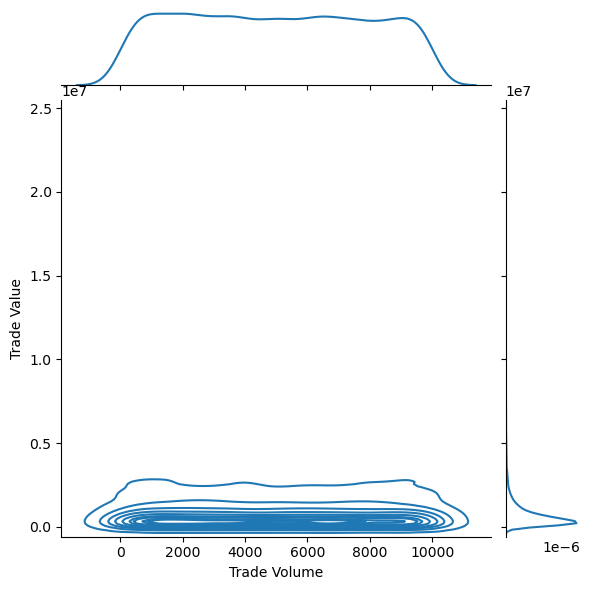

In [20]:
sns.jointplot(x='Trade Volume',y='Trade Value',data=dataset, kind='kde')

#it will help us to see the all combinations of the variables

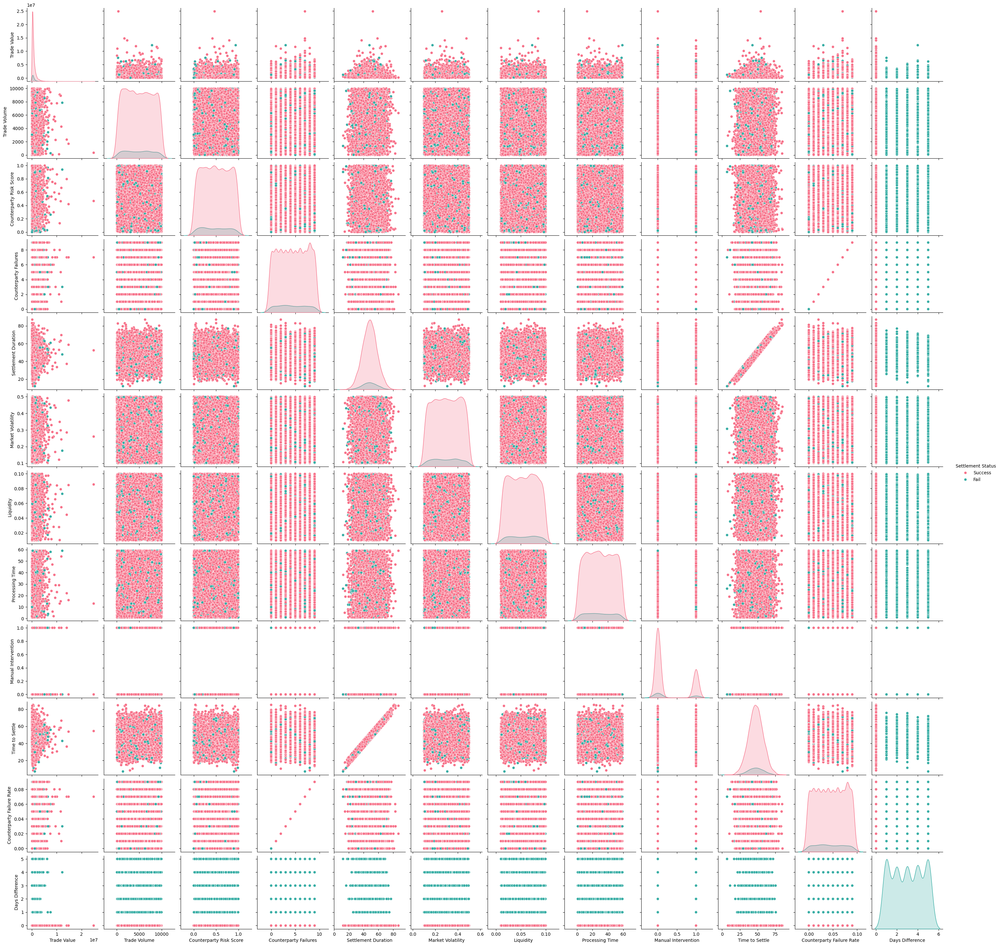

In [21]:
sns.pairplot(dataset,hue='Settlement Status',diag_kind='kde',kind='scatter',palette='husl')

#Most of seetlement happen between the 25 to 70 duration

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

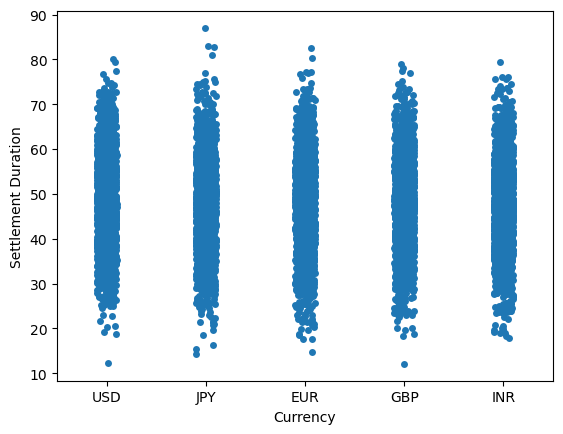

In [22]:
sns.stripplot(x='Currency',y='Settlement Duration',data=dataset)

#Most of seetlement happen between the 25 to 70 duration

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

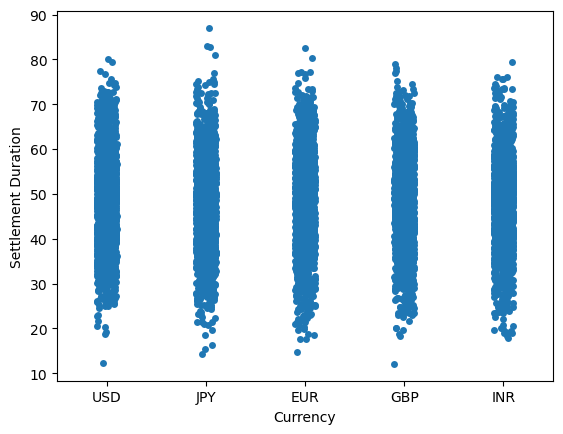

In [23]:
sns.stripplot(x='Currency',y='Settlement Duration',data=dataset,jitter=True)

#Most of seetlement happen between the 25 to 70 duration

C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 79.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 78.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 79.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 79.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='Currency', ylabel='Settlement Duration'>

C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 81.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 80.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 81.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 82.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Pandiyan\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 81.8

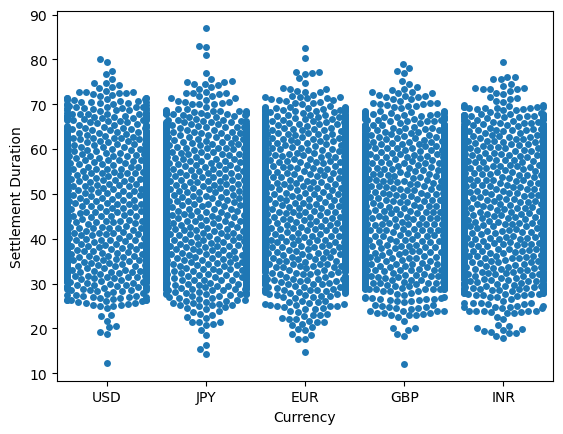

In [24]:
sns.swarmplot(x='Currency',y='Settlement Duration',data=dataset)

#Settlement duration for Failed and Success almost same

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

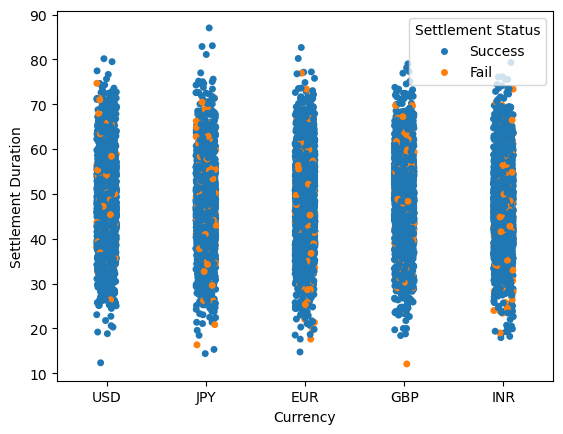

In [25]:
sns.stripplot(x='Currency',y='Settlement Duration',data=dataset,hue='Settlement Status')

#Most of the trade settlement duration are between 40 to 60

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

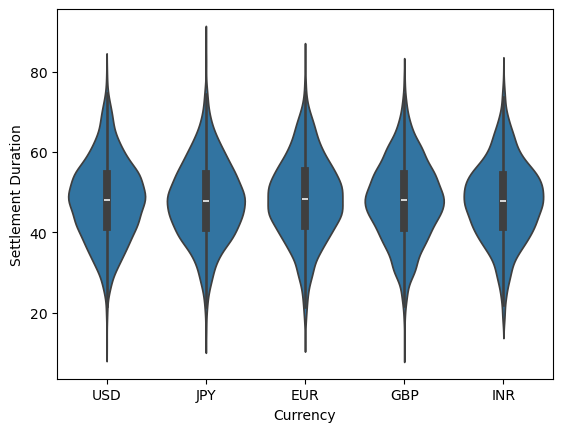

In [26]:
sns.violinplot(x='Currency',y='Settlement Duration',data=dataset)

#Density of both settlement success and fail are almost same.

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

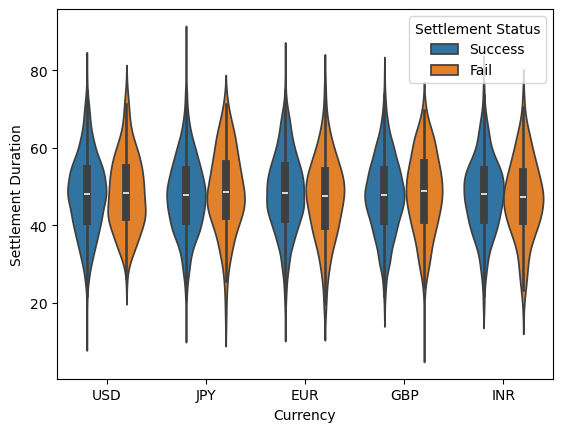

In [27]:
sns.violinplot(x='Currency',y='Settlement Duration',data=dataset,hue='Settlement Status')

#Settlement duration for Failed is higher for USD, JPY, GBP whereas less for EUR, INR

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

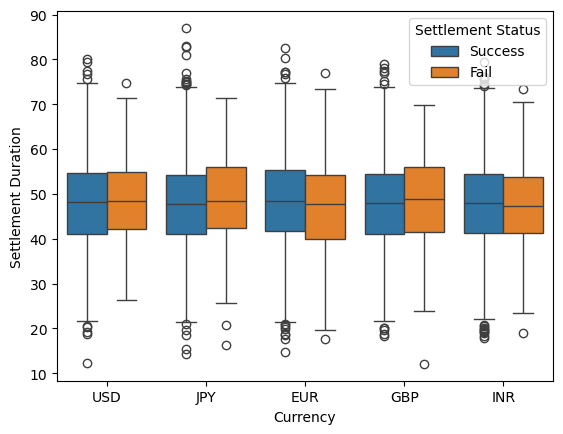

In [28]:
sns.boxplot(x='Currency',y='Settlement Duration',data=dataset,hue='Settlement Status')

#Settlement duration for Failed is higher for USD, JPY, GBP whereas less for EUR, INR

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

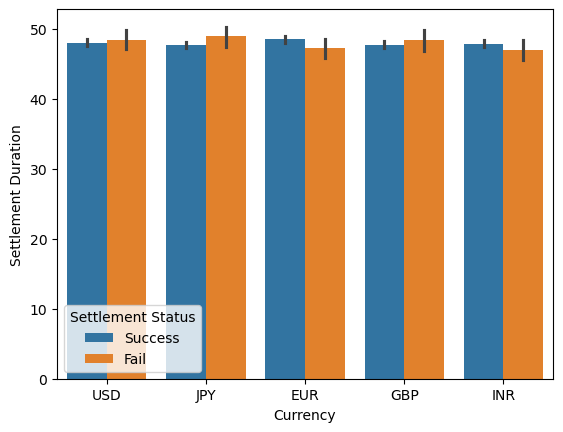

In [29]:
sns.barplot(x='Currency',y='Settlement Duration',data=dataset,hue='Settlement Status')

#Number of failed trades are less compared to Settled trades

<Axes: xlabel='Currency', ylabel='count'>

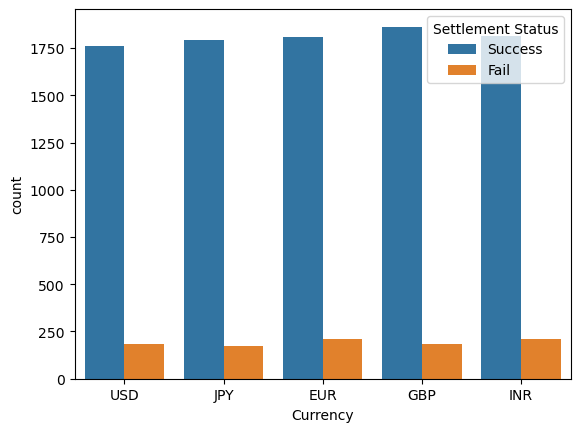

In [30]:
sns.countplot(x='Currency',data=dataset,hue='Settlement Status')

#Most of the Failed trades has manual intervention

<Axes: xlabel='Settlement Status', ylabel='count'>

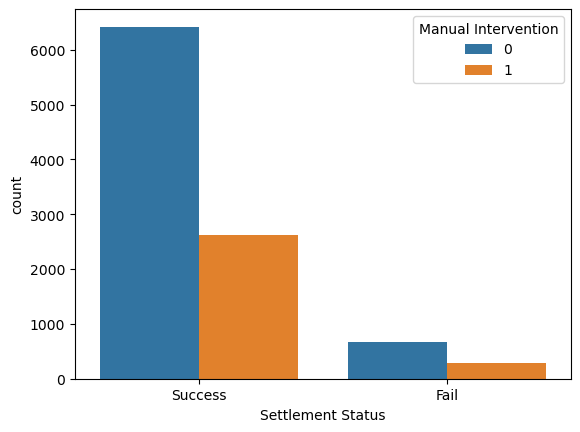

In [31]:
sns.countplot(x='Settlement Status',data=dataset,hue='Manual Intervention')

#Failed trades took more time for the currencis compared to Settled trades.

<Axes: xlabel='Currency', ylabel='Settlement Duration'>

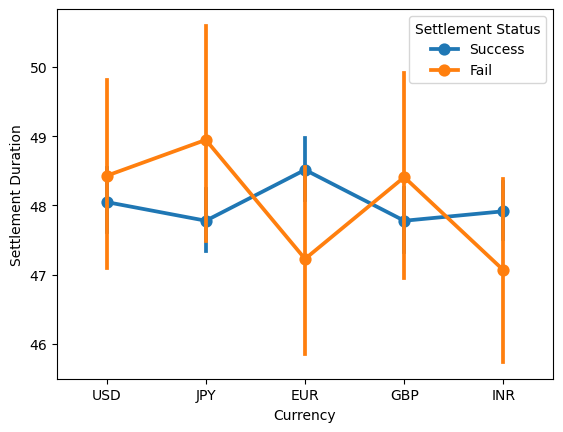

In [32]:
sns.pointplot(x='Currency',y='Settlement Duration',data=dataset,hue='Settlement Status')